In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai.vision import *
from fastai.callbacks.hooks import *
from fastai.utils.mem import *
import torch

torch.cuda.empty_cache()

In [4]:
path= !pwd; 
print(path)

['/home/nms105/course-v3/nbs/Art']


In [5]:
path_lbl = '/home/nms105/Art/Masks_all'
path_img ='/home/nms105/Art/Images_all'

In [6]:
fnames = get_image_files(path_img)
fnames[:3]

[PosixPath('/home/nms105/Art/Images_all/1.png'),
 PosixPath('/home/nms105/Art/Images_all/10.png'),
 PosixPath('/home/nms105/Art/Images_all/11.png')]

In [7]:
lbl_names = get_image_files(path_lbl)
lbl_names[:3]

[PosixPath('/home/nms105/Art/Masks_all/1.png'),
 PosixPath('/home/nms105/Art/Masks_all/10.png'),
 PosixPath('/home/nms105/Art/Masks_all/11.png')]

/home/nms105/Art/Images_all/37.png


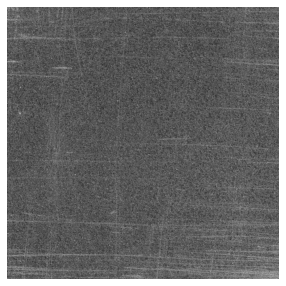

In [8]:
img_f = fnames[30]
img = open_image(img_f)
img.show(figsize=(5,5));print(img_f)

In [9]:
get_y_fn = lambda x: Path(str(x).replace('Images', 'Masks'))

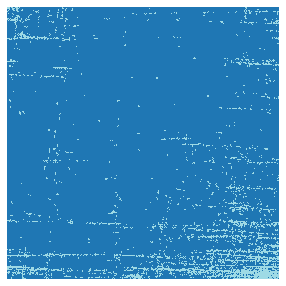

In [10]:
mask = open_mask(get_y_fn(img_f))

mask.show(figsize=(5,5), alpha=1)

In [11]:
src_size = np.array(mask.shape[1:])
src_size,mask.data

(array([1000, 1000]),
 tensor([[[0, 0, 0,  ..., 0, 0, 0],
          [0, 1, 1,  ..., 0, 0, 0],
          [1, 1, 1,  ..., 0, 0, 0],
          ...,
          [0, 0, 0,  ..., 0, 1, 1],
          [0, 0, 0,  ..., 0, 0, 1],
          [0, 0, 0,  ..., 1, 0, 1]]]))

In [12]:
codes = np.loadtxt('codes.txt', dtype=str); codes

array(['BG', 'Scratches', 'Void'], dtype='<U9')

In [13]:
size = src_size//2

free = gpu_mem_get_free_no_cache()
# the max size of bs depends on the available GPU RAM
if free < 8200: bs=4
else:           bs=8
print(f"using bs={bs}, have {free}MB of GPU RAM free")


using bs=8, have 12187MB of GPU RAM free


In [14]:
src = (SegmentationItemList.from_folder(path_img)
       .split_by_fname_file('valid.txt')
       .label_from_func(get_y_fn, classes=codes))

In [15]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

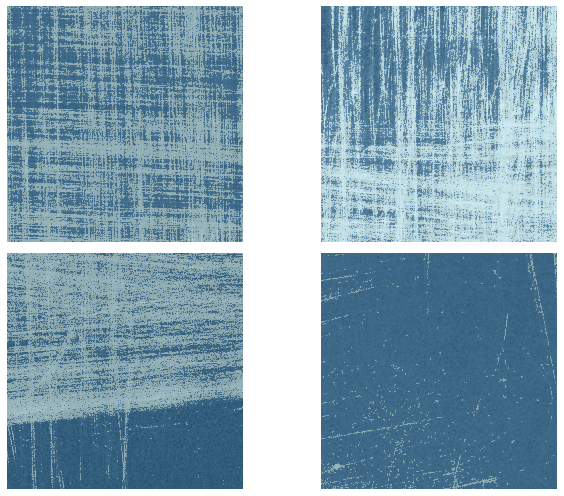

In [16]:
data.show_batch(2, figsize=(10,7))

In [17]:
wd=1e-2

In [18]:
name2id = {v:k for k,v in enumerate(codes)}
void_code = name2id['Void']

def acc(input, target):
    target = target.squeeze(1)
    mask = target != void_code
    return (input.argmax(dim=1)[mask]==target[mask]).float().mean()

In [19]:
learn = unet_learner(data, models.resnet34, metrics=acc, wd=wd)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


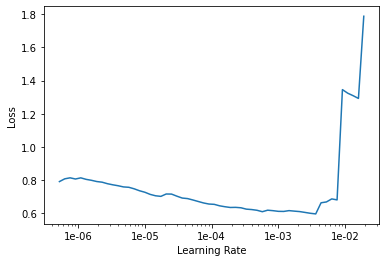

In [20]:
lr_find(learn)
fig1= learn.recorder.plot(9, figsize=(1,0.5), return_fig=True)

In [21]:
lr=1e-4

In [22]:
learn.fit_one_cycle(30, slice(lr), pct_start=0.9)

epoch,train_loss,valid_loss,acc,time
0,0.717647,0.571655,0.755219,00:12
1,0.639107,0.514656,0.805679,00:08
2,0.601586,0.503427,0.800753,00:08
3,0.578039,0.503070,0.794792,00:08
4,0.557588,0.519967,0.758995,00:08
5,0.542458,0.471537,0.797147,00:08
6,0.529754,0.437983,0.819653,00:08
7,0.512498,0.433866,0.813552,00:08
8,0.492206,0.407895,0.826591,00:08
9,0.478443,0.452247,0.802782,00:08


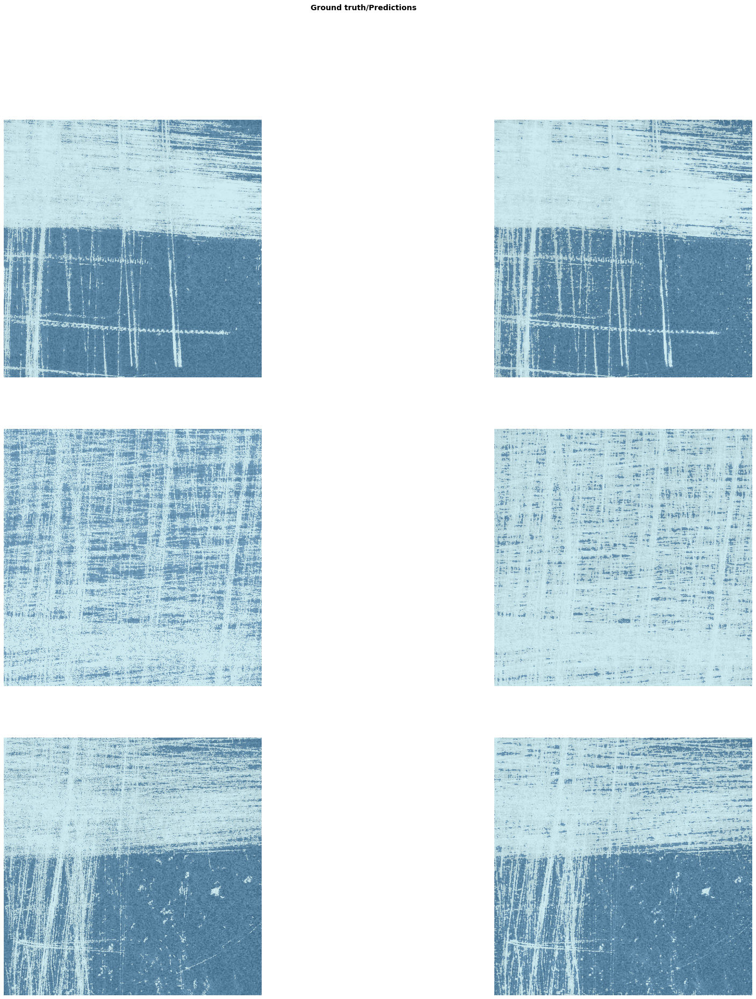

In [23]:
learn.show_results(rows=3, figsize=(30,30))

In [24]:
learn.save('/home/nms105/Art/stage-1')

In [25]:
learn.unfreeze()

In [26]:
lrs = slice(lr)

In [27]:
learn.fit_one_cycle(30, lrs, pct_start=0.9)

epoch,train_loss,valid_loss,acc,time
0,0.287147,0.321073,0.864138,00:09
1,0.288496,0.321687,0.865763,00:08
2,0.294626,0.323850,0.866599,00:08
3,0.291351,0.317885,0.865461,00:08
4,0.295967,0.313238,0.867965,00:08
5,0.293922,0.311327,0.870198,00:08
6,0.291721,0.308376,0.870494,00:08
7,0.289498,0.309992,0.872114,00:08
8,0.287788,0.315997,0.868691,00:08
9,0.287338,0.300589,0.876572,00:08


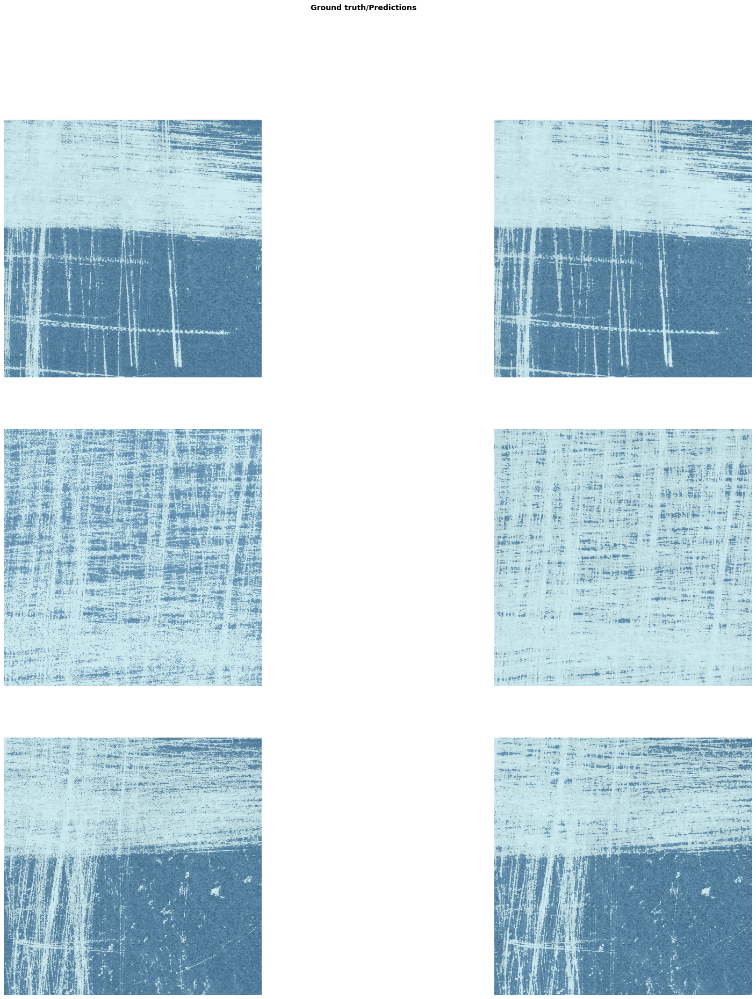

In [28]:
learn.show_results(rows=3, figsize=(30,30))

In [29]:
learn.save('/home/nms105/Art/stage-2')

In [30]:
size = src_size

free = gpu_mem_get_free_no_cache()
# the max size of bs depends on the available GPU RAM
if free > 8200: bs=2
else:           bs=4
print(f"using bs={bs}, have {free}MB of GPU RAM free")

using bs=2, have 8394MB of GPU RAM free


In [31]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

In [32]:
learn = unet_learner(data, models.resnet34, metrics=acc, wd=wd)

In [33]:
learn.load('/home/nms105/Art/stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (48 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Valid: LabelList (7 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


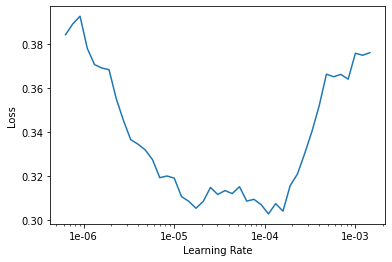

In [34]:
lr_find(learn)
learn.recorder.plot()

In [36]:
lr=5e-6

In [37]:
learn.fit_one_cycle(10, slice(lr), pct_start=0.8)

epoch,train_loss,valid_loss,acc,time
0,0.329340,0.301356,0.865790,00:31
1,0.348556,0.280461,0.874782,00:27
2,0.342521,0.285553,0.872691,00:27
3,0.349536,0.308149,0.864475,00:27
4,0.340287,0.285502,0.872890,00:27
5,0.346194,0.292334,0.870756,00:27
6,0.345954,0.293604,0.869735,00:27
7,0.337552,0.319089,0.858266,00:27
8,0.340095,0.304068,0.864040,00:27
9,0.345365,0.337344,0.853990,00:27


In [40]:
learn.save('/home/nms105/Art/stage-1-big')

In [41]:
learn.load('/home/nms105/Art/stage-1-big')

Learner(data=ImageDataBunch;

Train: LabelList (48 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Valid: LabelList (7 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_

In [42]:
learn.unfreeze()

In [43]:
lrs = slice(1e-6,lr/10)

In [44]:
learn.fit_one_cycle(10, lrs)

epoch,train_loss,valid_loss,acc,time
0,0.327084,0.359683,0.848327,00:29
1,0.327600,0.325488,0.858296,00:28
2,0.315369,0.316795,0.860138,00:28
3,0.332035,0.323341,0.858179,00:28
4,0.325080,0.318782,0.860220,00:28
5,0.333861,0.308387,0.862876,00:28
6,0.334669,0.356892,0.849723,00:28
7,0.337059,0.295842,0.867240,00:28
8,0.321794,0.326598,0.857909,00:28
9,0.324803,0.329263,0.856110,00:28


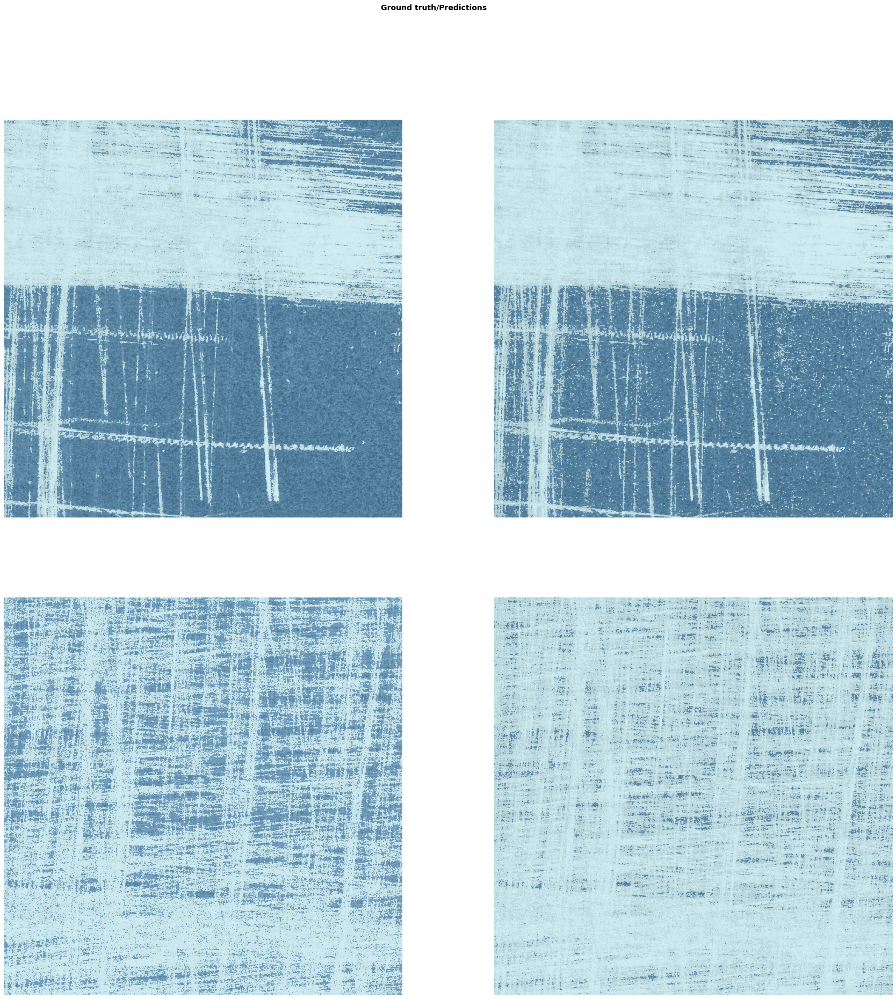

In [45]:
learn.show_results(rows=3, figsize=(30,30))

In [46]:
learn.save('/home/nms105/Art/stage-2-big')

In [47]:
learn.load('/home/nms105/Art/stage-2-big')

Learner(data=ImageDataBunch;

Train: LabelList (48 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Valid: LabelList (7 items)
x: SegmentationItemList
Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000),Image (3, 1000, 1000)
y: SegmentationLabelList
ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000),ImageSegment (1, 1000, 1000)
Path: /home/nms105/Art/Images_all;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_

In [121]:
import PIL
from PIL import Image
import numpy
import numpy as np
#predictions

In [506]:
filename= '33E_AT.png'

In [507]:
img = open_image('/home/nms105/Art/Anaysis-CNN/AT/'+filename)

In [511]:
prediction = learn.predict(img)

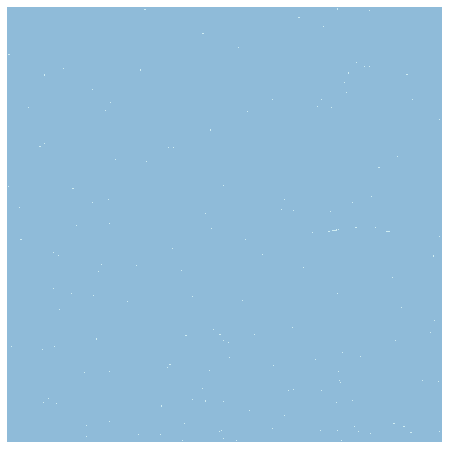

In [512]:
prediction[0].show(figsize=(8,8))

In [513]:
prediction[0].save('Res/'+filename)
